<a href="https://colab.research.google.com/github/WakwUp1125/DKU_OPENSOURCE_1/blob/main/object_detection_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Copyright 2018 The TensorFlow Hub Authors.

Licensed under the Apache License, Version 2.0 (the "License");

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Copyright 2018 The TensorFlow Hub Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

# 물체 감지


<table class="tfo-notebook-buttons" align="left">
  <td>     <a target="_blank" href="https://www.tensorflow.org/hub/tutorials/object_detection"><img src="https://www.tensorflow.org/images/tf_logo_32px.png">TensorFlow.org에서 보기</a>
</td>
  <td>     <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs-l10n/blob/master/site/ko/hub/tutorials/object_detection.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png">Google Colab에서 실행하기</a>
</td>
  <td>     <a target="_blank" href="https://github.com/tensorflow/docs-l10n/blob/master/site/ko/hub/tutorials/object_detection.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png">GitHub에서 보기</a>
</td>
  <td><a href="https://storage.googleapis.com/tensorflow_docs/docs-l10n/site/ko/hub/tutorials/object_detection.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png">노트북 다운론드하기</a></td>
  <td><a href="https://tfhub.dev/s?q=google%2Ffaster_rcnn%2Fopenimages_v4%2Finception_resnet_v2%2F1%20OR%20google%2Ffaster_rcnn%2Fopenimages_v4%2Finception_resnet_v2%2F1"><img src="https://www.tensorflow.org/images/hub_logo_32px.png">TF Hub 모델보기</a></td>
</table>

이 Colab은 물체 감지를 수행하도록 훈련된 TF-Hub 모듈의 사용 예를 보여줍니다.

## 설정


In [4]:
#@title Imports and function definitions

# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.15.0
The following GPU devices are available: /device:GPU:0


## 사용 예

### 이미지 다운로드 및 시각화를 위한 도우미 함수

가장 간단한 필수 기능을 제공하도록 [TF 물체 감지 API](https://github.com/tensorflow/models/blob/master/research/object_detection/utils/visualization_utils.py)에서 조정된 시각화 코드입니다.

In [5]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.LANCZOS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getbbox(ds)[3] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    bbox = font.getbbox(display_str)
    text_width, text_height = bbox[2], bbox[3]
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

## 모듈 적용하기

Open Images v4에서 공개 이미지를 로드하고 로컬에 저장한 다음 표시합니다.

Image downloaded to /tmp/tmp51ofp83m.jpg.


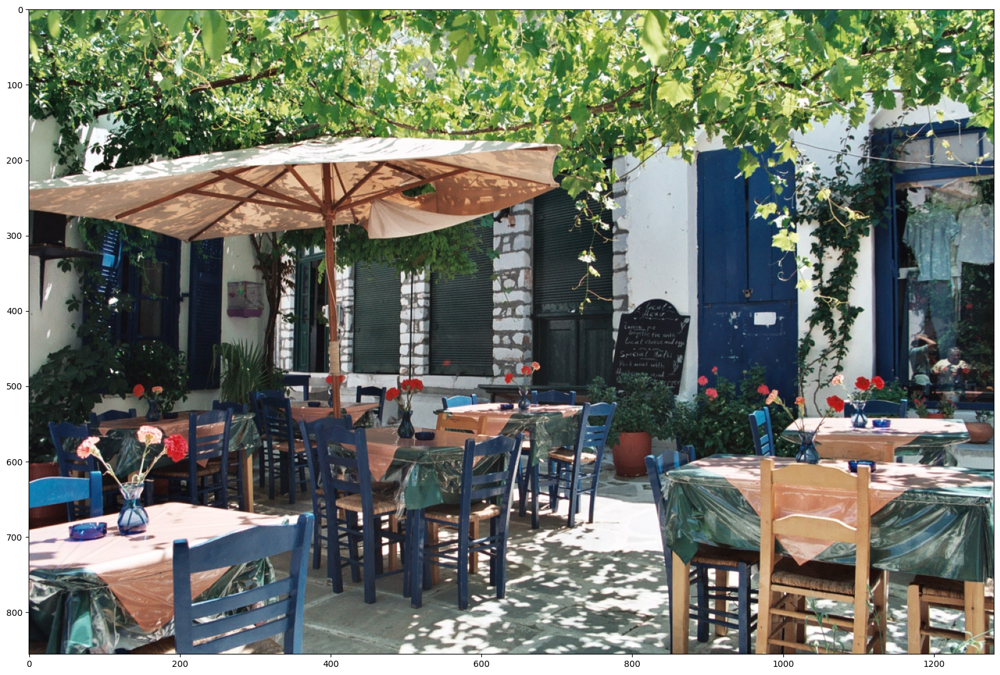

In [6]:
# By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"  #@param
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

물체 감지 모듈을 선택하고 다운로드한 이미지에 적용합니다. 모듈:

- **FasterRCNN+InceptionResNet V2**: 높은 정확성
- **ssd + mobilenet V2**: 작고 빠름

In [7]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" #@param ["https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1", "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"]

detector = hub.load(module_handle).signatures['default']

In [8]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [9]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  55.137450218200684


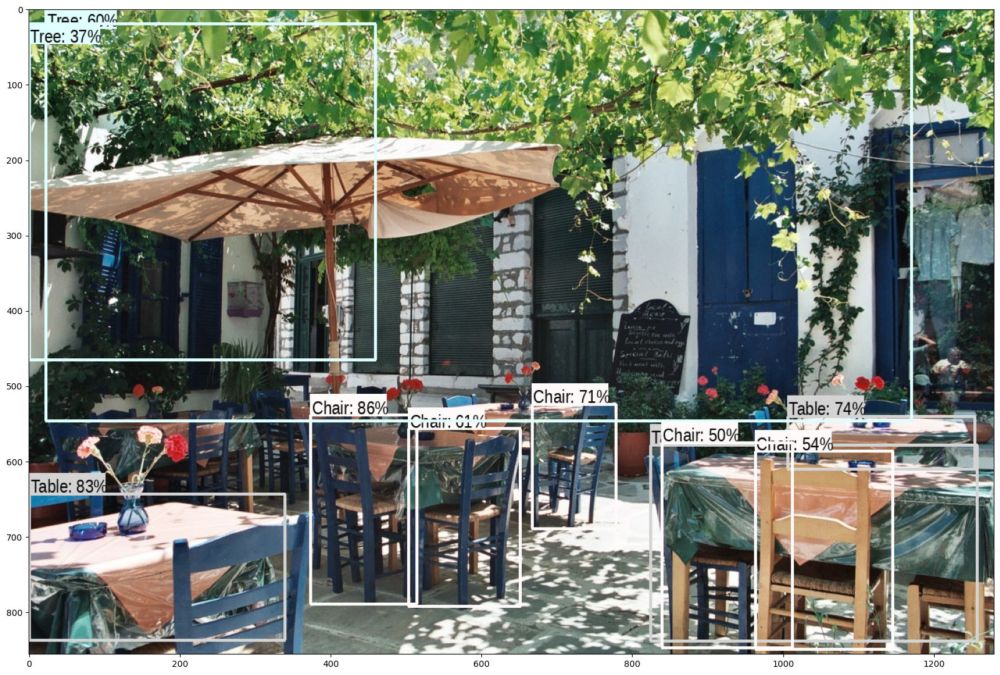

In [10]:
run_detector(detector, downloaded_image_path)

### 더 많은 이미지

시간 추적을 사용하여 일부 추가 이미지에 추론을 수행합니다.


In [11]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
  start_time = time.time()
  image_path = download_and_resize_image(image_url, 640, 480)
  run_detector(detector, image_path)
  end_time = time.time()
  print("Inference time:",end_time-start_time)

Image downloaded to /tmp/tmpqyyxgwnp.jpg.
Found 100 objects.
Inference time:  4.925732135772705
Inference time: 5.3652567863464355


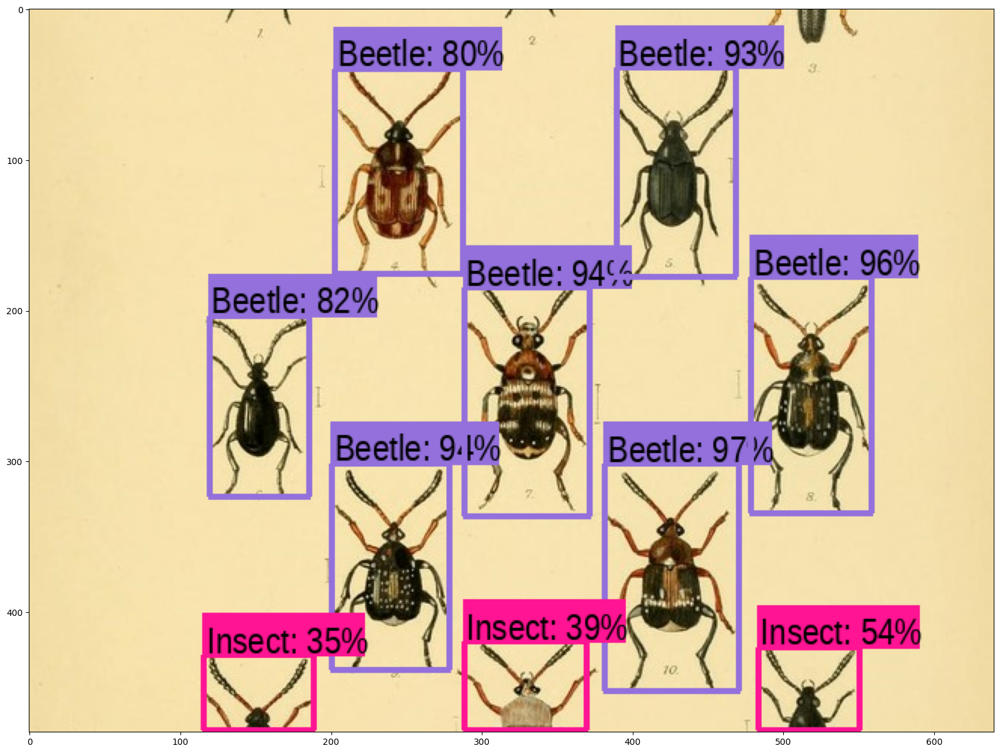

In [12]:
detect_img(image_urls[0])

Image downloaded to /tmp/tmpl1r0euyw.jpg.
Found 100 objects.
Inference time:  1.1152839660644531
Inference time: 1.3242487907409668


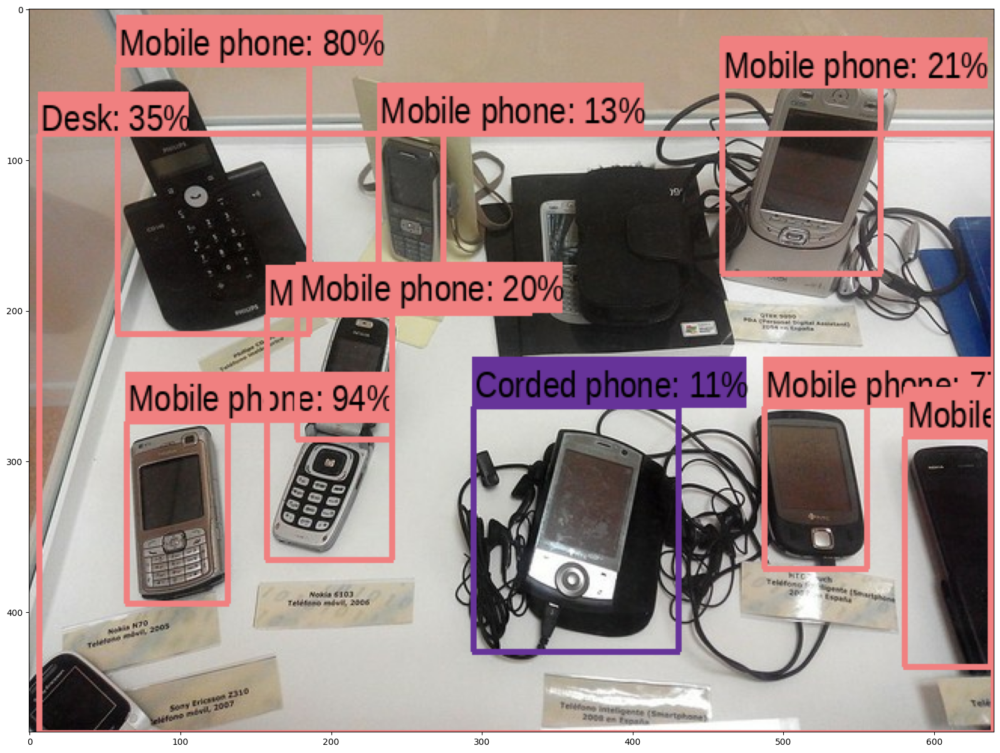

In [13]:
detect_img(image_urls[1])

Image downloaded to /tmp/tmpi7di4ucv.jpg.
Found 100 objects.
Inference time:  1.2062172889709473
Inference time: 1.5237596035003662


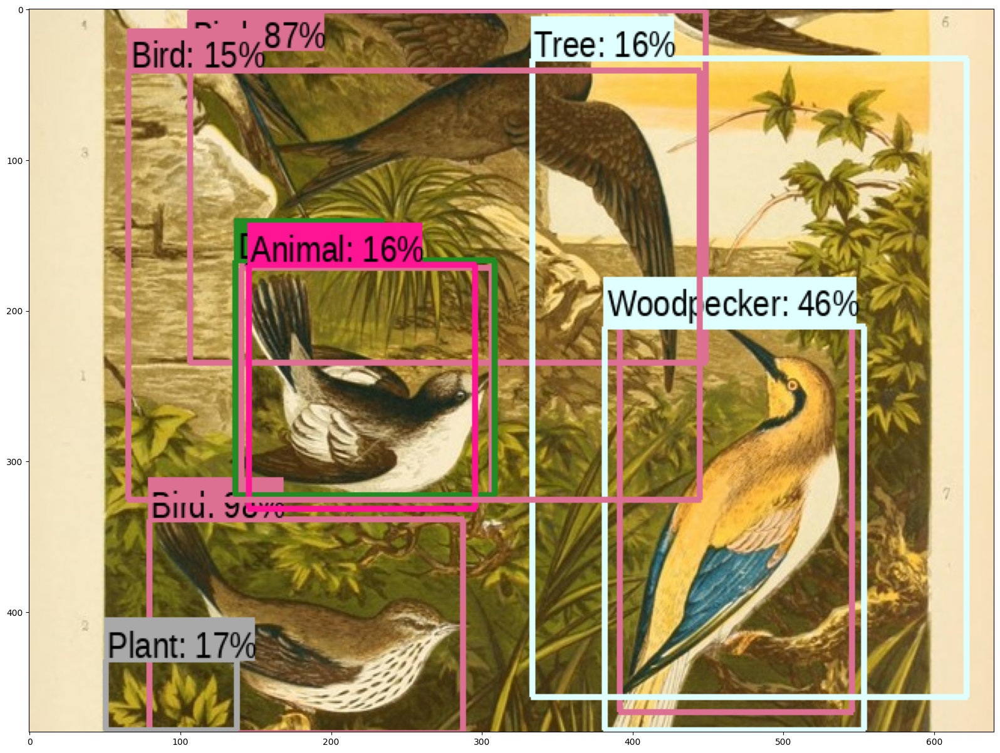

In [14]:
detect_img(image_urls[2])

Found 100 objects.
Inference time:  1.2719311714172363
Inference time: 2.243969678878784


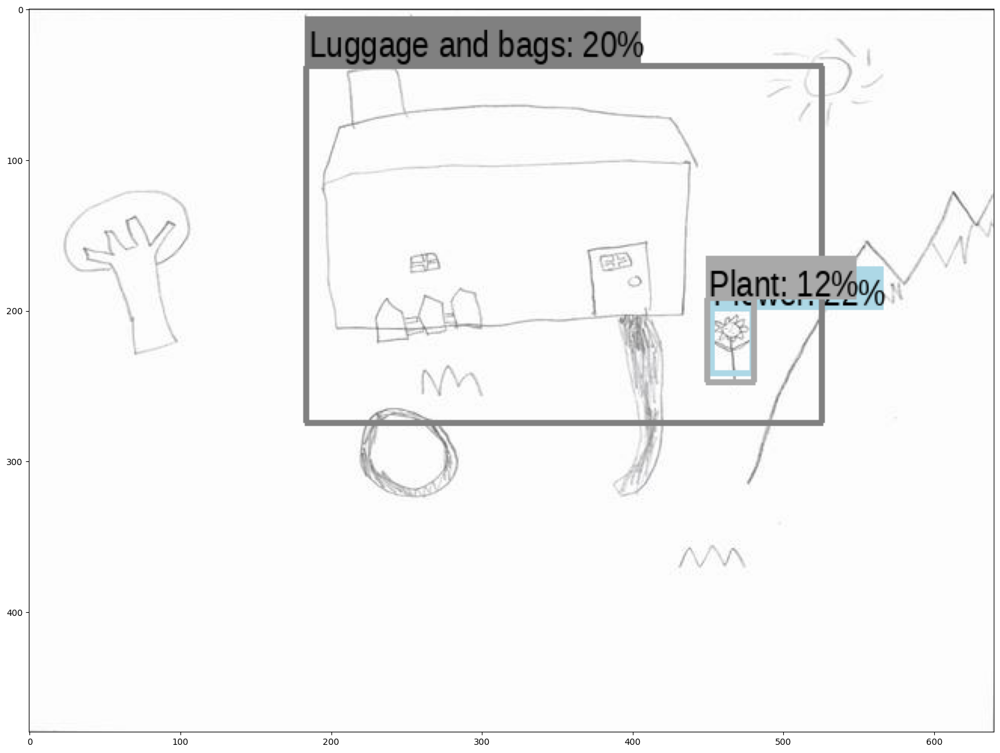

In [15]:
import os
import requests
from PIL import Image
from io import BytesIO
import time

def download_and_resize_image(url, width, height):
    try:
        response = requests.get(url)

        if response.status_code != 200:
            print(f"Failed to download image. HTTP status code: {response.status_code}")
            return None

        image = Image.open(BytesIO(response.content))
        image = image.convert("RGB")

        # Create a temporary directory if it doesn't exist
        temp_dir = "/path/to/temp/"
        os.makedirs(temp_dir, exist_ok=True)

        # Resize the image using LANCZOS resampling
        image = image.resize((width, height), Image.LANCZOS)

        # Save the resized image to a temporary file
        temp_file_path = os.path.join(temp_dir, "temp_image.jpg")
        image.save(temp_file_path)

        return temp_file_path
    except Exception as e:
        print(f"Error downloading or resizing image: {e}")
        return None

def detect_img(image_url):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        run_detector(detector, image_path)
        end_time = time.time()
        print("Inference time:", end_time - start_time)
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1YeXn5Stn0Ek2BO1SfLsUyMj6ehKk5BgV"]
detect_img(image_urls[0])


Found 100 objects.
Inference time:  1.3869943618774414
Inference time: 2.362504482269287


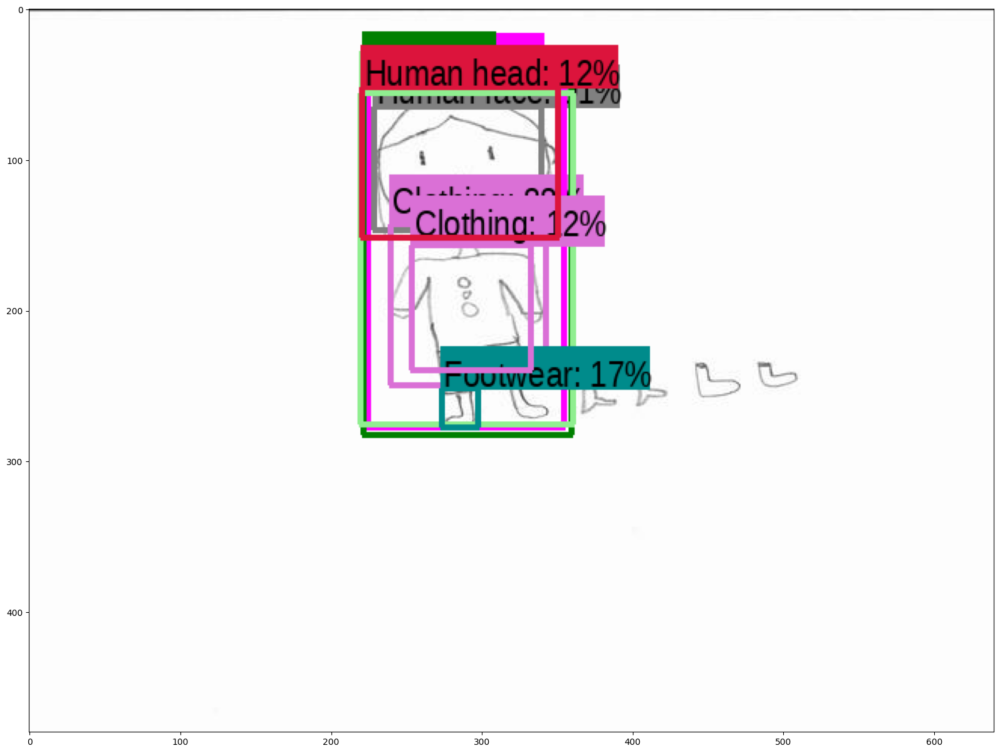

In [16]:
import os
import requests
from PIL import Image
from io import BytesIO
import time

def download_and_resize_image(url, width, height):
    try:
        response = requests.get(url)

        if response.status_code != 200:
            print(f"Failed to download image. HTTP status code: {response.status_code}")
            return None

        image = Image.open(BytesIO(response.content))
        image = image.convert("RGB")

        # Create a temporary directory if it doesn't exist
        temp_dir = "/path/to/temp/"
        os.makedirs(temp_dir, exist_ok=True)

        # Resize the image using LANCZOS resampling
        image = image.resize((width, height), Image.LANCZOS)

        # Save the resized image to a temporary file
        temp_file_path = os.path.join(temp_dir, "temp_image.jpg")
        image.save(temp_file_path)

        return temp_file_path
    except Exception as e:
        print(f"Error downloading or resizing image: {e}")
        return None

def detect_img(image_url):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        run_detector(detector, image_path)
        end_time = time.time()
        print("Inference time:", end_time - start_time)
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1T1Su-UhZRQ-krH05Y0pc_d855eSRafnB"]
detect_img(image_urls[0])


Found 100 objects.
Inference time:  1.212456464767456
Inference time: 2.1784286499023438


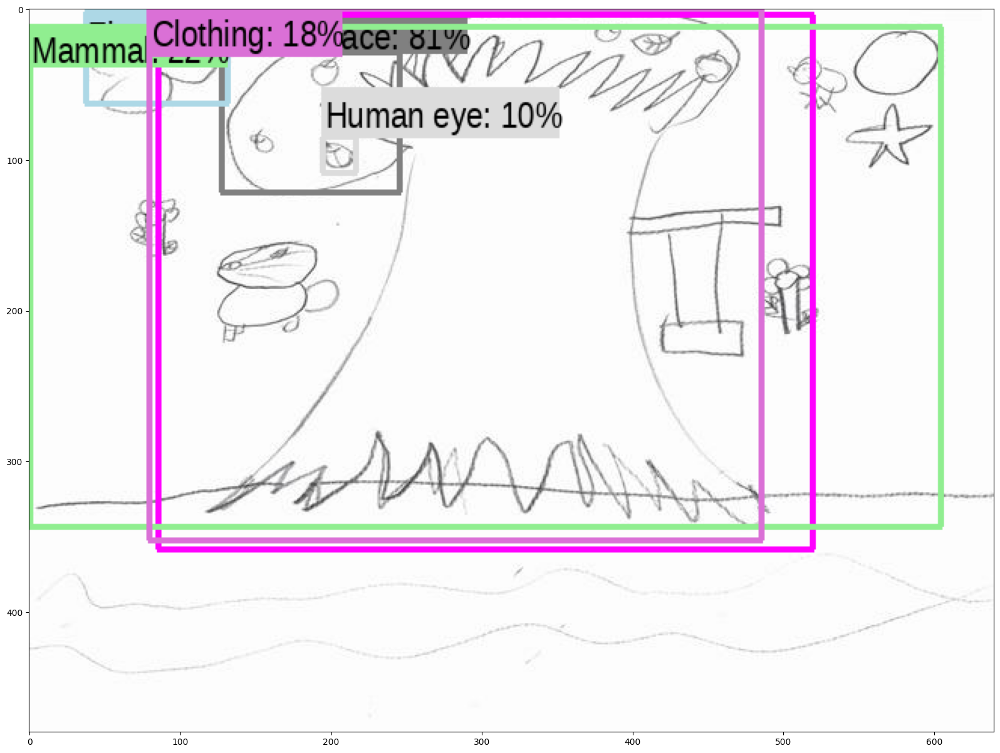

In [17]:
import os
import requests
from PIL import Image
from io import BytesIO
import time

def download_and_resize_image(url, width, height):
    try:
        response = requests.get(url)

        if response.status_code != 200:
            print(f"Failed to download image. HTTP status code: {response.status_code}")
            return None

        image = Image.open(BytesIO(response.content))
        image = image.convert("RGB")

        # Create a temporary directory if it doesn't exist
        temp_dir = "/path/to/temp/"
        os.makedirs(temp_dir, exist_ok=True)

        # Resize the image using LANCZOS resampling
        image = image.resize((width, height), Image.LANCZOS)

        # Save the resized image to a temporary file
        temp_file_path = os.path.join(temp_dir, "temp_image.jpg")
        image.save(temp_file_path)

        return temp_file_path
    except Exception as e:
        print(f"Error downloading or resizing image: {e}")
        return None

def detect_img(image_url):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        run_detector(detector, image_path)
        end_time = time.time()
        print("Inference time:", end_time - start_time)
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1WVEPxtu6QLSFSw1p82CHD1DF0I9QKRVp"]
detect_img(image_urls[0])

In [18]:
import os
import requests
from PIL import Image
from io import BytesIO
import time
import tensorflow as tf

def download_and_resize_image(url, width, height):
    try:
        response = requests.get(url)

        if response.status_code != 200:
            print(f"Failed to download image. HTTP status code: {response.status_code}")
            return None

        image = Image.open(BytesIO(response.content))
        image = image.convert("RGB")

        # Create a temporary directory if it doesn't exist
        temp_dir = "/path/to/temp/"
        os.makedirs(temp_dir, exist_ok=True)

        # Resize the image using LANCZOS resampling
        image = image.resize((width, height), Image.LANCZOS)

        # Save the resized image to a temporary file
        temp_file_path = os.path.join(temp_dir, "temp_image.jpg")
        image.save(temp_file_path)

        return temp_file_path
    except Exception as e:
        print(f"Error downloading or resizing image: {e}")
        return None

def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

def run_detector(detector, img):
    converted_img = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    result = detector(converted_img)
    result = {key: value.numpy() for key, value in result.items()}
    return result

def detect_and_output_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract object information
            for i in range(len(objects["detection_scores"])):
                score = objects["detection_scores"][i]
                class_name = objects["detection_class_entities"][i].decode("utf-8")  # Use class name instead of class ID
                box = objects["detection_boxes"][i]
                ymin, xmin, ymax, xmax = box.tolist()

                # Convert normalized coordinates to image coordinates
                im_height, im_width, _ = img.shape
                ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

                print(f"Object: {class_name}")
                print(f"  - Score: {score}")
                print(f"  - Box: ymin={ymin}, xmin={xmin}, ymax={ymax}, xmax={xmax}")
                print()

        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1T1Su-UhZRQ-krH05Y0pc_d855eSRafnB"]
detect_and_output_objects(image_urls[0])


Inference time: 1.1874330043792725
Object: Human face
  - Score: 0.9188711643218994
  - Box: ymin=65.45639991760254, xmin=228.6406707763672, ymax=146.24736785888672, xmax=340.0953674316406

Object: Clothing
  - Score: 0.8875599503517151
  - Box: ymin=143.2770824432373, xmin=239.38541412353516, ymax=249.92042541503906, xmax=343.44303131103516

Object: Person
  - Score: 0.5748290419578552
  - Box: ymin=44.66237783432007, xmin=224.1045379638672, ymax=277.7267646789551, xmax=355.21312713623047

Object: Boy
  - Score: 0.2215125411748886
  - Box: ymin=48.87830972671509, xmin=221.73954010009766, ymax=282.328462600708, xmax=360.8479309082031

Object: Mammal
  - Score: 0.19063550233840942
  - Box: ymin=56.08659625053406, xmin=219.0960693359375, ymax=275.0356864929199, xmax=361.7641830444336

Object: Footwear
  - Score: 0.17954286932945251
  - Box: ymin=252.94824600219727, xmin=273.4403991699219, ymax=277.4226665496826, xmax=298.36368560791016

Object: Clothing
  - Score: 0.12894640862941742
  -

In [19]:
def extract_desired_objects(objects, img):
    desired_objects = ["Person", "Human head", "Human eye", "Human nose", "Human neck","Human mouth", "Human body", "Human arm", "Human leg", "Human hand", "Foot"]

    object_dict = {}

    for i in range(len(objects["detection_scores"])):
        score = objects["detection_scores"][i]
        class_name = objects["detection_class_entities"][i].decode("utf-8")
        box = objects["detection_boxes"][i]
        ymin, xmin, ymax, xmax = box.tolist()

        # Convert normalized coordinates to image coordinates
        im_height, im_width, _ = img.shape
        ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

        if class_name in desired_objects:
            # If the object is not in the dictionary or has a higher score, update the dictionary
            if class_name not in object_dict or score > object_dict[class_name]["Score"]:
                object_dict[class_name] = {
                    "Score": score,
                    "Box": {"ymin": ymin, "xmin": xmin, "ymax": ymax, "xmax": xmax}
                }

    # Convert the dictionary to a list
    extracted_objects = [{"Object": key, **value} for key, value in object_dict.items()]

    # If no desired object is detected, return null
    if not extracted_objects:
        return None

    return extracted_objects

def detect_and_output_desired_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract desired objects
            desired_objects = extract_desired_objects(objects, img)

            if desired_objects is not None:
                # Output information about desired objects
                for obj in desired_objects:
                    print(f"Object: {obj['Object']}")
                    print(f"  - Score: {obj['Score']}")
                    print(f"  - Box: ymin={obj['Box']['ymin']}, xmin={obj['Box']['xmin']}, ymax={obj['Box']['ymax']}, xmax={obj['Box']['xmax']}")
                    print()
            else:
                print("No desired objects detected.")
        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1T1Su-UhZRQ-krH05Y0pc_d855eSRafnB"]
detect_and_output_desired_objects(image_urls[0])


Inference time: 1.1263320446014404
Object: Person
  - Score: 0.5748290419578552
  - Box: ymin=44.66237783432007, xmin=224.1045379638672, ymax=277.7267646789551, xmax=355.21312713623047

Object: Human head
  - Score: 0.12256859987974167
  - Box: ymin=52.99981713294983, xmin=220.63671112060547, ymax=151.37454986572266, xmax=351.69422149658203

Object: Human nose
  - Score: 0.06834139674901962
  - Box: ymin=99.92048263549805, xmin=272.4711036682129, ymax=118.61355543136597, xmax=298.87365341186523

Object: Human mouth
  - Score: 0.03029176965355873
  - Box: ymin=114.14789199829102, xmin=276.09365463256836, ymax=130.53009510040283, xmax=297.7910614013672

Object: Human eye
  - Score: 0.008548418059945107
  - Box: ymin=97.33122110366821, xmin=262.77273178100586, ymax=108.1494927406311, xmax=275.3487014770508

Object: Human leg
  - Score: 0.007510706316679716
  - Box: ymin=173.5173797607422, xmin=300.64414978027344, ymax=264.94059562683105, xmax=342.00439453125

Object: Human body
  - Score:

In [20]:
def calculate_depression_score(obj_type, ymin, ymax, image_height):
    # 기본 우울 정도
    default_depression_score = 38.00

    # 객체에 따른 우울 정도 계산
    if obj_type == "Person":
        if ymin < image_height / 3:
            return 25.94
        elif image_height / 3 < ymin < 2 * image_height / 3:
            return 26.83
        elif ymax > 2 * image_height / 3:
            return 26.25
        else:
            return default_depression_score
    elif obj_type == "Human head":
        return 26.38
    elif obj_type == "Human eye":
        return 26.32
    elif obj_type == "Human nose":
        return 26.00
    elif obj_type == "Human neck":
        return 26.53
    elif obj_type == "Human mouth":
        return 26.15
    elif obj_type == "Human body":
        return 26.36
    elif obj_type == "Human arm":
        return 26.37
    elif obj_type == "Human leg":
        return 26.43
    elif obj_type == "Human hand":
        return 26.18
    elif obj_type == "Foot":
        return 26.18
    else:
        return default_depression_score

def extract_desired_objects(objects, img, image_height):
    desired_objects = ["Person", "Human head", "Human eye", "Human nose", "Human neck","Human mouth", "Human body", "Human arm", "Human leg", "Human hand", "Foot"]

    object_dict = {}
    total_score = 0

    for i in range(len(objects["detection_scores"])):
        score = objects["detection_scores"][i]
        class_name = objects["detection_class_entities"][i].decode("utf-8")
        box = objects["detection_boxes"][i]
        ymin, xmin, ymax, xmax = box.tolist()

        # Convert normalized coordinates to image coordinates
        im_height, im_width, _ = img.shape
        ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

        if class_name in desired_objects:
            # If the object is not in the dictionary or has a higher score, update the dictionary
            if class_name not in object_dict or score > object_dict[class_name]["Score"]:
                depression_score = calculate_depression_score(class_name, ymin, ymax, image_height)
                object_dict[class_name] = {
                    "Score": depression_score,
                    "Box": {"ymin": ymin, "xmin": xmin, "ymax": ymax, "xmax": xmax}
                }
                total_score += depression_score

    # Convert the dictionary to a list
    extracted_objects = [{"Object": key, **value} for key, value in object_dict.items()]

    # If no desired object is detected, return null
    if not extracted_objects:
        return None, None

    # Calculate average depression score
    average_score = total_score / len(extracted_objects)

    return extracted_objects, average_score

def detect_and_output_desired_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract desired objects
            desired_objects, average_score = extract_desired_objects(objects, img, img.shape[0])

            if desired_objects is not None:
                # Output information about desired objects
                for obj in desired_objects:
                    print(f"Object: {obj['Object']}")
                    print(f"  - Score: {obj['Score']}")
                    print(f"  - Box: ymin={obj['Box']['ymin']}, xmin={obj['Box']['xmin']}, ymax={obj['Box']['ymax']}, xmax={obj['Box']['xmax']}")
                    print()

                # Output total and average depression scores
                print(f"Total Depression Score: {average_score * len(desired_objects)}")
                print(f"Average Depression Score: {average_score}")
            else:
                print("No desired objects detected.")
        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1T1Su-UhZRQ-krH05Y0pc_d855eSRafnB"]
detect_and_output_desired_objects(image_urls[0])


Inference time: 1.111936092376709
Object: Person
  - Score: 25.94
  - Box: ymin=44.66237783432007, xmin=224.1045379638672, ymax=277.7267646789551, xmax=355.21312713623047

Object: Human head
  - Score: 26.38
  - Box: ymin=52.99981713294983, xmin=220.63671112060547, ymax=151.37454986572266, xmax=351.69422149658203

Object: Human nose
  - Score: 26.0
  - Box: ymin=99.92048263549805, xmin=272.4711036682129, ymax=118.61355543136597, xmax=298.87365341186523

Object: Human mouth
  - Score: 26.15
  - Box: ymin=114.14789199829102, xmin=276.09365463256836, ymax=130.53009510040283, xmax=297.7910614013672

Object: Human eye
  - Score: 26.32
  - Box: ymin=97.33122110366821, xmin=262.77273178100586, ymax=108.1494927406311, xmax=275.3487014770508

Object: Human leg
  - Score: 26.43
  - Box: ymin=173.5173797607422, xmin=300.64414978027344, ymax=264.94059562683105, xmax=342.00439453125

Object: Human body
  - Score: 26.36
  - Box: ymin=56.73906326293945, xmin=223.8824462890625, ymax=270.2629566192627,

In [21]:
import os
import requests
from PIL import Image
from io import BytesIO
import time
import tensorflow as tf

def download_and_resize_image(url, width, height):
    try:
        response = requests.get(url)

        if response.status_code != 200:
            print(f"Failed to download image. HTTP status code: {response.status_code}")
            return None

        image = Image.open(BytesIO(response.content))
        image = image.convert("RGB")

        # Create a temporary directory if it doesn't exist
        temp_dir = "/path/to/temp/"
        os.makedirs(temp_dir, exist_ok=True)

        # Resize the image using LANCZOS resampling
        image = image.resize((width, height), Image.LANCZOS)

        # Save the resized image to a temporary file
        temp_file_path = os.path.join(temp_dir, "temp_image.jpg")
        image.save(temp_file_path)

        return temp_file_path
    except Exception as e:
        print(f"Error downloading or resizing image: {e}")
        return None

def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

def run_detector(detector, img):
    converted_img = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    result = detector(converted_img)
    result = {key: value.numpy() for key, value in result.items()}
    return result

def detect_and_output_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract object information
            for i in range(len(objects["detection_scores"])):
                score = objects["detection_scores"][i]
                class_name = objects["detection_class_entities"][i].decode("utf-8")  # Use class name instead of class ID
                box = objects["detection_boxes"][i]
                ymin, xmin, ymax, xmax = box.tolist()

                # Convert normalized coordinates to image coordinates
                im_height, im_width, _ = img.shape
                ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

                print(f"Object: {class_name}")
                print(f"  - Score: {score}")
                print(f"  - Box: ymin={ymin}, xmin={xmin}, ymax={ymax}, xmax={xmax}")
                print()

        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1YeXn5Stn0Ek2BO1SfLsUyMj6ehKk5BgV"]
detect_and_output_objects(image_urls[0])

Inference time: 1.3296582698822021
Object: Flower
  - Score: 0.22503980994224548
  - Box: ymin=199.33934211730957, xmin=452.4604797363281, ymax=241.44527435302734, xmax=480.316162109375

Object: Luggage and bags
  - Score: 0.20525601506233215
  - Box: ymin=38.820351362228394, xmin=183.99791717529297, ymax=274.5015335083008, xmax=526.4521026611328

Object: Plant
  - Score: 0.12934966385364532
  - Box: ymin=192.74970531463623, xmin=449.02854919433594, ymax=247.798433303833, xmax=481.9969940185547

Object: Headphones
  - Score: 0.08936282992362976
  - Box: ymin=2.8178101032972336, xmin=162.58026123046875, ymax=312.14335441589355, xmax=505.5125427246094

Object: Mushroom
  - Score: 0.08900279551744461
  - Box: ymin=114.70566987991333, xmin=28.021118640899658, ymax=223.89995098114014, xmax=100.60315132141113

Object: Handbag
  - Score: 0.08066955208778381
  - Box: ymin=21.364490389823914, xmin=172.0237159729004, ymax=274.8842239379883, xmax=446.78516387939453

Object: Luggage and bags
  - S

In [22]:
def extract_desired_objects(objects, img):
    desired_objects = ["House", "Roof", "Wall", "Door", "Wall","Window", "Chimney", "Smoke"]

    object_dict = {}

    for i in range(len(objects["detection_scores"])):
        score = objects["detection_scores"][i]
        class_name = objects["detection_class_entities"][i].decode("utf-8")
        box = objects["detection_boxes"][i]
        ymin, xmin, ymax, xmax = box.tolist()

        # Convert normalized coordinates to image coordinates
        im_height, im_width, _ = img.shape
        ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

        if class_name in desired_objects:
            # If the object is not in the dictionary or has a higher score, update the dictionary
            if class_name not in object_dict or score > object_dict[class_name]["Score"]:
                object_dict[class_name] = {
                    "Score": score,
                    "Box": {"ymin": ymin, "xmin": xmin, "ymax": ymax, "xmax": xmax}
                }

    # Convert the dictionary to a list
    extracted_objects = [{"Object": key, **value} for key, value in object_dict.items()]

    # If no desired object is detected, return null
    if not extracted_objects:
        return None

    return extracted_objects

def detect_and_output_desired_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract desired objects
            desired_objects = extract_desired_objects(objects, img)

            if desired_objects is not None:
                # Output information about desired objects
                for obj in desired_objects:
                    print(f"Object: {obj['Object']}")
                    print(f"  - Score: {obj['Score']}")
                    print(f"  - Box: ymin={obj['Box']['ymin']}, xmin={obj['Box']['xmin']}, ymax={obj['Box']['ymax']}, xmax={obj['Box']['xmax']}")
                    print()
            else:
                print("No desired objects detected.")
        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1YeXn5Stn0Ek2BO1SfLsUyMj6ehKk5BgV"]
detect_and_output_desired_objects(image_urls[0])


Inference time: 1.3116333484649658
Object: House
  - Score: 0.00870595034211874
  - Box: ymin=21.03897750377655, xmin=148.57003211975098, ymax=233.7088394165039, xmax=446.7885971069336



In [23]:
def calculate_depression_score(obj_type, ymin, ymax, image_height):
    # 기본 우울 정도
    default_depression_score = 36.33

    # 객체에 따른 우울 정도 계산
    if obj_type == "House":
        if ymin < image_height / 3:
            return 25.78
        elif image_height / 3 < ymin < 2 * image_height / 3:
            return 26.14
        elif ymax > 2 * image_height / 3:
            return 26.84
        else:
            return default_depression_score
    elif obj_type == "Roof":
        return 26.43
    elif obj_type == "Wall":
        return 26.20
    elif obj_type == "Door":
        return 26.34
    elif obj_type == "Window":
        return 26.29
    elif obj_type == "Chimney":
        return 26.20
    elif obj_type == "Smoke":
        return 26.20
    else:
        return default_depression_score

def extract_desired_objects(objects, img, image_height):
    desired_objects = ["House", "Roof", "Wall", "Door", "Window","Chimney", "Smoke"]

    object_dict = {}
    total_score = 0

    for i in range(len(objects["detection_scores"])):
        score = objects["detection_scores"][i]
        class_name = objects["detection_class_entities"][i].decode("utf-8")
        box = objects["detection_boxes"][i]
        ymin, xmin, ymax, xmax = box.tolist()

        # Convert normalized coordinates to image coordinates
        im_height, im_width, _ = img.shape
        ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

        if class_name in desired_objects:
            # If the object is not in the dictionary or has a higher score, update the dictionary
            if class_name not in object_dict or score > object_dict[class_name]["Score"]:
                depression_score = calculate_depression_score(class_name, ymin, ymax, image_height)
                object_dict[class_name] = {
                    "Score": depression_score,
                    "Box": {"ymin": ymin, "xmin": xmin, "ymax": ymax, "xmax": xmax}
                }
                total_score += depression_score

    # Convert the dictionary to a list
    extracted_objects = [{"Object": key, **value} for key, value in object_dict.items()]

    # If no desired object is detected, return null
    if not extracted_objects:
        return None, None

    # Calculate average depression score
    average_score = total_score / len(extracted_objects)

    return extracted_objects, average_score

def detect_and_output_desired_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract desired objects
            desired_objects, average_score = extract_desired_objects(objects, img, img.shape[0])

            if desired_objects is not None:
                # Output information about desired objects
                for obj in desired_objects:
                    print(f"Object: {obj['Object']}")
                    print(f"  - Score: {obj['Score']}")
                    print(f"  - Box: ymin={obj['Box']['ymin']}, xmin={obj['Box']['xmin']}, ymax={obj['Box']['ymax']}, xmax={obj['Box']['xmax']}")
                    print()

                # Output total and average depression scores
                print(f"Total Depression Score: {average_score * len(desired_objects)}")
                print(f"Average Depression Score: {average_score}")
            else:
                print("No desired objects detected.")
        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1YeXn5Stn0Ek2BO1SfLsUyMj6ehKk5BgV"]
detect_and_output_desired_objects(image_urls[0])


Inference time: 1.1437580585479736
Object: House
  - Score: 25.78
  - Box: ymin=21.03897750377655, xmin=148.57003211975098, ymax=233.7088394165039, xmax=446.7885971069336

Total Depression Score: 25.78
Average Depression Score: 25.78


In [24]:
import os
import requests
from PIL import Image
from io import BytesIO
import time
import tensorflow as tf

def download_and_resize_image(url, width, height):
    try:
        response = requests.get(url)

        if response.status_code != 200:
            print(f"Failed to download image. HTTP status code: {response.status_code}")
            return None

        image = Image.open(BytesIO(response.content))
        image = image.convert("RGB")

        # Create a temporary directory if it doesn't exist
        temp_dir = "/path/to/temp/"
        os.makedirs(temp_dir, exist_ok=True)

        # Resize the image using LANCZOS resampling
        image = image.resize((width, height), Image.LANCZOS)

        # Save the resized image to a temporary file
        temp_file_path = os.path.join(temp_dir, "temp_image.jpg")
        image.save(temp_file_path)

        return temp_file_path
    except Exception as e:
        print(f"Error downloading or resizing image: {e}")
        return None

def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

def run_detector(detector, img):
    converted_img = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    result = detector(converted_img)
    result = {key: value.numpy() for key, value in result.items()}
    return result

def detect_and_output_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract object information
            for i in range(len(objects["detection_scores"])):
                score = objects["detection_scores"][i]
                class_name = objects["detection_class_entities"][i].decode("utf-8")  # Use class name instead of class ID
                box = objects["detection_boxes"][i]
                ymin, xmin, ymax, xmax = box.tolist()

                # Convert normalized coordinates to image coordinates
                im_height, im_width, _ = img.shape
                ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

                print(f"Object: {class_name}")
                print(f"  - Score: {score}")
                print(f"  - Box: ymin={ymin}, xmin={xmin}, ymax={ymax}, xmax={xmax}")
                print()

        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1WVEPxtu6QLSFSw1p82CHD1DF0I9QKRVp"]
detect_and_output_objects(image_urls[0])

Inference time: 1.212158203125
Object: Human face
  - Score: 0.8196881413459778
  - Box: ymin=29.36781942844391, xmin=127.92619705200195, ymax=121.67913436889648, xmax=246.28253936767578

Object: Flower
  - Score: 0.29016947746276855
  - Box: ymin=2.0488496124744415, xmin=37.47468709945679, ymax=62.023937702178955, xmax=132.09269523620605

Object: Person
  - Score: 0.24909308552742004
  - Box: ymin=4.70034196972847, xmin=85.45954704284668, ymax=358.6918544769287, xmax=520.4351425170898

Object: Mammal
  - Score: 0.22236058115959167
  - Box: ymin=12.02777087688446, xmin=0.0, ymax=343.430871963501, xmax=605.2508544921875

Object: Clothing
  - Score: 0.1860586404800415
  - Box: ymin=0.0, xmin=79.55673694610596, ymax=352.8071880340576, xmax=486.7002868652344

Object: Human eye
  - Score: 0.10438843071460724
  - Box: ymin=85.53810596466064, xmin=194.5905876159668, ymax=108.0814003944397, xmax=217.6340103149414

Object: Human head
  - Score: 0.09747405350208282
  - Box: ymin=12.7565735578536

In [25]:
def extract_desired_objects(objects, img):
    desired_objects = ["Tree", "Stem", "Branch", "Crown", "Root", "Flower", "Fruit", "Leaf", "Knothole", "Bark"]

    object_dict = {}

    for i in range(len(objects["detection_scores"])):
        score = objects["detection_scores"][i]
        class_name = objects["detection_class_entities"][i].decode("utf-8")
        box = objects["detection_boxes"][i]
        ymin, xmin, ymax, xmax = box.tolist()

        # Convert normalized coordinates to image coordinates
        im_height, im_width, _ = img.shape
        ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

        if class_name in desired_objects:
            # If the object is not in the dictionary or has a higher score, update the dictionary
            if class_name not in object_dict or score > object_dict[class_name]["Score"]:
                object_dict[class_name] = {
                    "Score": score,
                    "Box": {"ymin": ymin, "xmin": xmin, "ymax": ymax, "xmax": xmax}
                }

    # Convert the dictionary to a list
    extracted_objects = [{"Object": key, **value} for key, value in object_dict.items()]

    # If no desired object is detected, return null
    if not extracted_objects:
        return None

    return extracted_objects

def detect_and_output_desired_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract desired objects
            desired_objects = extract_desired_objects(objects, img)

            if desired_objects is not None:
                # Output information about desired objects
                for obj in desired_objects:
                    print(f"Object: {obj['Object']}")
                    print(f"  - Score: {obj['Score']}")
                    print(f"  - Box: ymin={obj['Box']['ymin']}, xmin={obj['Box']['xmin']}, ymax={obj['Box']['ymax']}, xmax={obj['Box']['xmax']}")
                    print()
            else:
                print("No desired objects detected.")
        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1WVEPxtu6QLSFSw1p82CHD1DF0I9QKRVp"]
detect_and_output_desired_objects(image_urls[0])


Inference time: 1.2001755237579346
Object: Flower
  - Score: 0.29016947746276855
  - Box: ymin=2.0488496124744415, xmin=37.47468709945679, ymax=62.023937702178955, xmax=132.09269523620605

Object: Tree
  - Score: 0.00560736283659935
  - Box: ymin=0.0, xmin=51.650047302246094, ymax=415.70849418640137, xmax=635.1386642456055



In [26]:
def calculate_depression_score(obj_type, ymin, ymax, image_height):
    # 기본 우울 정도
    default_depression_score = 33.00

    # 객체에 따른 우울 정도 계산
    if obj_type == "Tree":
        if ymin < image_height / 3:
            return 26.15
        elif image_height / 3 < ymin < 2 * image_height / 3:
            return 25.89
        elif ymax > 2 * image_height / 3:
            return 26.88
        else:
            return default_depression_score
    elif obj_type == "Stem":
        return 26.35
    elif obj_type == "Branch":
        return 26.24
    elif obj_type == "Crown":
        return 26.01
    elif obj_type == "Root":
        return 26.59
    elif obj_type == "Flower":
        return 26.75
    elif obj_type == "Fruit":
        return 25.16
    elif obj_type == "Leaf":
        return 26.28
    elif obj_type == "Knothole":
        return 26.12
    elif obj_type == "Bark":
        return 26.00
    else:
        return default_depression_score

def extract_desired_objects(objects, img, image_height):
    desired_objects = ["Tree", "Stem", "Branch", "Crown", "Root","Flower", "Fruit", "Leaf", "Knothole", "Bark"]

    object_dict = {}
    total_score = 0

    for i in range(len(objects["detection_scores"])):
        score = objects["detection_scores"][i]
        class_name = objects["detection_class_entities"][i].decode("utf-8")
        box = objects["detection_boxes"][i]
        ymin, xmin, ymax, xmax = box.tolist()

        # Convert normalized coordinates to image coordinates
        im_height, im_width, _ = img.shape
        ymin, xmin, ymax, xmax = ymin * im_height, xmin * im_width, ymax * im_height, xmax * im_width

        if class_name in desired_objects:
            # If the object is not in the dictionary or has a higher score, update the dictionary
            if class_name not in object_dict or score > object_dict[class_name]["Score"]:
                depression_score = calculate_depression_score(class_name, ymin, ymax, image_height)
                object_dict[class_name] = {
                    "Score": depression_score,
                    "Box": {"ymin": ymin, "xmin": xmin, "ymax": ymax, "xmax": xmax}
                }
                total_score += depression_score

    # Convert the dictionary to a list
    extracted_objects = [{"Object": key, **value} for key, value in object_dict.items()]

    # If no desired object is detected, return null
    if not extracted_objects:
        return None, None

    # Calculate average depression score
    average_score = total_score / len(extracted_objects)

    return extracted_objects, average_score

def detect_and_output_desired_objects(image_url):
    image_path = download_and_resize_image(image_url, 640, 480)

    if image_path is not None:
        start_time = time.time()
        img = load_img(image_path)
        objects = run_detector(detector, img)

        if objects is not None:
            end_time = time.time()
            print("Inference time:", end_time - start_time)

            # Extract desired objects
            desired_objects, average_score = extract_desired_objects(objects, img, img.shape[0])

            if desired_objects is not None:
                # Output information about desired objects
                for obj in desired_objects:
                    print(f"Object: {obj['Object']}")
                    print(f"  - Score: {obj['Score']}")
                    print(f"  - Box: ymin={obj['Box']['ymin']}, xmin={obj['Box']['xmin']}, ymax={obj['Box']['ymax']}, xmax={obj['Box']['xmax']}")
                    print()

                # Output total and average depression scores
                print(f"Total Depression Score: {average_score * len(desired_objects)}")
                print(f"Average Depression Score: {average_score}")
            else:
                print("No desired objects detected.")
        else:
            print("Object detection failed.")
    else:
        print("Image download or processing failed.")

# Usage
image_urls = ["https://drive.google.com/uc?id=1WVEPxtu6QLSFSw1p82CHD1DF0I9QKRVp"]
detect_and_output_desired_objects(image_urls[0])


Inference time: 1.4416446685791016
Object: Flower
  - Score: 26.75
  - Box: ymin=2.0488496124744415, xmin=37.47468709945679, ymax=62.023937702178955, xmax=132.09269523620605

Object: Tree
  - Score: 26.15
  - Box: ymin=0.0, xmin=51.650047302246094, ymax=415.70849418640137, xmax=635.1386642456055

Total Depression Score: 52.9
Average Depression Score: 26.45
